# GANomaly
- 2020.08.16 : gen 20 / lr 1e-5

# 개발일지
- 2020.08.15 : 분율 추출 구현 / 이상치 상관계수 추출 구현 / 모델 save, load 구현
- 2020.08.16 : anomaly detect 이미지 저장 구현 / 티타늄(Ti64) 상대 밀도 계산 구현

--- 

# Module

In [1]:
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torchvision.utils import save_image
import os
import numpy as np

import torchvision.datasets as dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils

# Graph & Animation
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Hyper Parameter

In [2]:
latent_size = 100  # z벡터의 잠재공간(latent space)의 크기
workers = 4    # 0일때, 약 20% 사용 4일 경우 메모리 100%
img_size = 64
channel = 1
epochs = 100
batch_size = 64
learning_rate = 1e-5

# Data and Device

In [3]:
# 이미지 경로, 이미지들 리사이즈 및 텐서형태로 만들기
#data_root = "../../dataset/train"
CFRP_aug_data_root = "../../dataset/aug_train/aug_CFRP"

data_set = dataset.ImageFolder(root = CFRP_aug_data_root, # data_root,
                           transform = transforms.Compose([
                                  #transforms.Resize(img_size),
                                  transforms.CenterCrop(img_size),
                                  torchvision.transforms.Grayscale(channel),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5,),(0.5,))
                              ]))

print("size of dataset :", len(data_set))

# 배치로 나누고 셔플하기
data_loader = torch.utils.data.DataLoader(data_set, batch_size = batch_size,
                                         shuffle = True, num_workers = workers, drop_last=True)

# Device setting (GPU or CPU)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print("device :", device)

size of dataset : 1368
device : cuda:0


# MODEL

In [4]:
# GANomaly : Generative Adversarial Networks Model using Decoder with AutoEncoder

# === Decoder 모델 ===
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder,self).__init__()
        
        # Batch Normalization 유무에 따른 G_block 정의
        def DC_conv_block(in_features, out_features):
            block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
            ]
            return block
        
        def DC_deconv_block(in_features, out_features, FIRST=True):
            if FIRST:
                block = [
                    nn.ConvTranspose2d(in_features, out_features, 4, 1, 0, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.ConvTranspose2d(in_features, out_features, 4, 2, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            return block
        
        
        # ======================= 픽셀 분포 생성 layer ======================= 
        self.DC_gen_distribution = nn.Sequential(
            # ------ input is latent_size 100 ------ 
            *DC_deconv_block(latent_size, img_size*8, FIRST=True),
            # ------ state size is 512x4x4 ------ 
            *DC_conv_block(img_size*8, img_size*8),
            # ------ state size is 512x4x4 ------   
            *DC_deconv_block(img_size*8, img_size*4, FIRST=False),
            # ------ state size is 256x8x8 ------ 
            *DC_conv_block(img_size*4, img_size*4),
            # ------ state size is 256x8x8 ------ 
            *DC_deconv_block(img_size*4, img_size*2, FIRST=False),
            # ------ state size is 128x16x16 ------ 
            *DC_conv_block(img_size*2, img_size*2),
            # ------ state size is 128x16x16 ------ 
            *DC_deconv_block(img_size*2, img_size, FIRST=False),
        )
        
        # =================== 가짜 이미지 생성 layer =================== 
        self.DC_gen_fake_img = nn.Sequential(
            # ------ state size is 64x32x32 ------ 
            nn.ConvTranspose2d(img_size, 1, 4, 2, 1, bias=False),
            nn.Tanh() # 픽셀값의 범위 : -1 ~ 1로 두기 위해서
            # ------ state size is 1x64x64 ------ 
        )
    
    def forward(self, input):
        distribution = self.DC_gen_distribution(input)
        fake_img = self.DC_gen_fake_img(distribution)
        
        return fake_img


# === Discriminator 모델 ===
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        # Batch Normalization 유무에 따른 D_block 정의
        def D_block(in_features, out_features, MP=True):
            if MP:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU(),
                    nn.MaxPool2d(2)
                ]
            return block
        
        # ============== Feature 추출 layer ==============
        self.D_extract_feature = nn.Sequential(
            # ------ input is 1 x 64 x 64 ------ 
            *D_block(channel, img_size, MP=False),
            # ------ input is 64 x 64 x 64 ------ 
            *D_block(img_size, img_size, MP=True),
            # ------ state is 64 x 32 x 32 ------ 
            *D_block(img_size, img_size*2, MP=False),
            # ------ state is 128 x 32 x 32 ------ 
            *D_block(img_size*2, img_size*2, MP=True),
            # ------ state is 128 x 16 x 16 ------ 
            *D_block(img_size*2, img_size*4, MP=False),
            # ------ state is 256 x 16 x 16 ------ 
            *D_block(img_size*4, img_size*4, MP=True),
            # ------ state is 256 x 8 x 8 ------ 
            *D_block(img_size*4, img_size*8, MP=False),
            # ------ state is 512 x 8 x 8 ------ 
            *D_block(img_size*8, img_size*8, MP=True),
        )
        
        # ===================== 이진 분류 layer =====================
        self.D_classification = nn.Sequential(        
            # ------- state size 512x4x4 ------- 
            nn.Conv2d(img_size*8, channel, 4, 1, 0, bias=False),
            #nn.Linear(fms*8*4*4, 1, bias=False),
            nn.Sigmoid()        
        )
        
    def forward(self, input):
        feature = self.D_extract_feature(input)
        classification = self.D_classification(feature)
        
        return classification, feature 


# === Encoder Model ===
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        
        def EC_block(in_features, out_features, MP=True):
            if MP:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU(),
                    nn.MaxPool2d(2)
                ]
            return block
        
        # ============== Feature 추출 ==============
        self.EC_extract_feature = nn.Sequential(
            # ------ input is 1 x 64 x 64 ------ 
            *EC_block(channel, img_size, MP=False),
            # ------ input is 64 x 64 x 64 ------ 
            *EC_block(img_size, img_size, MP=True),
            # ------ state is 64 x 32 x 32 ------ 
            *EC_block(img_size, img_size*2, MP=False),
            # ------ state is 128 x 32 x 32 ------ 
            *EC_block(img_size*2, img_size*2, MP=True),
            # ------ state is 128 x 16 x 16 ------ 
            *EC_block(img_size*2, img_size*4, MP=False),
            # ------ state is 256 x 16 x 16 ------ 
            *EC_block(img_size*4, img_size*4, MP=True),
            # ------ state is 256 x 8 x 8 ------ 
            *EC_block(img_size*4, img_size*8, MP=False),
            # ------ state is 512 x 8 x 8 ------ 
            *EC_block(img_size*8, img_size*8, MP=True),
        )
        
        # =============== Encoder Training layer ===============
        self.EC_validate = nn.Sequential(
            # -------state is 512 x 4 x 4-------
            nn.Conv2d(img_size*8, latent_size, 4, 1, 0, bias=False),
            nn.Tanh()
            # -------state is 100 x 97 x 97-------
        )
        
    def forward(self, input):
        feature = self.EC_extract_feature(input)
        validity = self.EC_validate(feature)
        
        return validity

# Loss & Optim

In [5]:
# DC and D 무게 초기화, classname 에 찾는 name가 없다면 -1 ,
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


# D,DC,EC 네트워크 모델 객체 선언
D = Discriminator().to(device)
DC = Decoder().to(device)
EC = Encoder().to(device)

# weight initialize/ nn.Module 클래스 안에 apply 함수가 정의되 있음, 각 함수들에 다 적용 하게한다
D.apply(weights_init)
DC.apply(weights_init)
EC.apply(weights_init)

# Binary cross entropy loss and optimizer
DCGAN_criterion = nn.BCELoss()
AE_criterion = nn.MSELoss()

# latent vector에 배치 사이즈 64를 적용
# 학습한 DC로 새로운 것 만들어서 결과 확인 할때 사용
noise_z = torch.randn(img_size, latent_size, 1, 1, device = device)

# D와 DC에 대해 두가지 최적화 설정
D_optimizer = torch.optim.Adam(D.parameters(), lr = learning_rate, betas=(0.5,0.999))
DC_optimizer = torch.optim.Adam(DC.parameters(), lr = learning_rate, betas=(0.5,0.999))
EC_optimizer = torch.optim.Adam(EC.parameters(), lr = learning_rate, betas=(0.5,0.999))

#print(D)
#print(DC)
#print(EC)

def reset_grad():
    D_optimizer.zero_grad()
    DC_optimizer.zero_grad()

---

# Train DCGAN

In [6]:
img_list = []
DC_losses = []
D_losses = []
iters = 0

def train_DCGAN(epoch, learning_DC_per_D = 4):
    global epochs
    global iters
    
    # 인덱스 0부터 세기 시작
    # data[0].size():64x1x64x64(image) / data[1].size():64(label)
    for i,data in enumerate(data_loader,0):
        
        # Train D
        real_img = data[0].to(device) # image size: 64x1x64x64(batch, channel, width, height)
        b_size = real_img.size(0) # b_size = 64
        real_labels = torch.ones(b_size, 1).to(device)
        fake_labels = torch.zeros(b_size, 1).to(device)
        
        # (--------------------------real-----------------------------)
        real_classification, _ = D(real_img) # output = D(x)
        real_loss = DCGAN_criterion(real_classification, real_labels) # D(x)=1일 때의 loss
        real_score = real_classification
        D_x = real_score.mean().item() 
            
        # (--------------------------fake-----------------------------)
        z = torch.randn(b_size, latent_size, 1, 1).to(device) # z size :64x100x1x1
        fake_img = DC(z)
        fake_classification, _ = D(fake_img) # output = D(DC(z))
        fake_loss = DCGAN_criterion(fake_classification, fake_labels) # D(DC(z))=0일 때의 loss
        fake_score = fake_classification
        D_DC_z1 = fake_score.mean().item()

        # (------------------Backprop and optimize---------------------)
        D_loss = real_loss + fake_loss
        reset_grad()
        D_loss.backward()
        D_optimizer.step() # D(x)=1, D(DC(z))=0이어야 D가 최적

        
        # Train DC
        #z = torch.randn(b_size,latent_size,1,1,device=device) # z size :64x100x1x1
        for k in range(learning_DC_per_D):
            fake_img = DC(z)
            fake_classification,_ = D(fake_img)  # output : D(DC(z))
            D_DC_z2 = fake_classification.mean().item()
            DC_loss = DCGAN_criterion(fake_classification, real_labels) # D(DC(z))=1일 때의 loss=log(D(DC(z)))

            # (------------------Backprop and optimize---------------------)
            reset_grad()
            DC_loss.backward()
            DC_optimizer.step() # D(DC(z))=1 이어야 DC가 최적
            # ==> D(DC(z))의 값이 0.5로 수렴해야 한다.
        
        
        # print
        print('[%d/%d][%d/%d]\n- D_loss : %.4f / DC_loss : %.4f\n- D(x):%.4f / D(DC(z1)) : %.4f / D(DC(z2)) : %.4f' 
                   %(epoch+1, epochs, i, len(data_loader),D_loss.item(),
                     DC_loss.item(),D_x,D_DC_z1,D_DC_z2))
        
        # Save Losses for plotting later
        DC_losses.append(DC_loss.item())
        D_losses.append(D_loss.item())
        
        #Check how the generator is doing by saving G's output on noise_z
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = DC(noise_z).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
        
#torch.save(E.state_dict(), 'E.ckpt')

In [7]:
for epoch in range(epochs):
    train_DCGAN(epoch, learning_DC_per_D = 20)

/home/piai/anaconda3/envs/pytorch/lib/python3.6/site-packages/torch/nn/modules/loss.py:498: UserWarning: Using a target size (torch.Size([64, 1])) that is different to the input size (torch.Size([64, 1, 1, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)


[1/100][0/21]
- D_loss : 1.3885 / DC_loss : 0.6000
- D(x):0.4968 / D(DC(z1)) : 0.4978 / D(DC(z2)) : 0.5488
[1/100][1/21]
- D_loss : 1.3790 / DC_loss : 0.5943
- D(x):0.4975 / D(DC(z1)) : 0.4937 / D(DC(z2)) : 0.5520
[1/100][2/21]
- D_loss : 1.3783 / DC_loss : 0.5965
- D(x):0.4954 / D(DC(z1)) : 0.4912 / D(DC(z2)) : 0.5508
[1/100][3/21]
- D_loss : 1.3691 / DC_loss : 0.5988
- D(x):0.4956 / D(DC(z1)) : 0.4867 / D(DC(z2)) : 0.5495
[1/100][4/21]
- D_loss : 1.3671 / DC_loss : 0.5993
- D(x):0.4963 / D(DC(z1)) : 0.4864 / D(DC(z2)) : 0.5493
[1/100][5/21]
- D_loss : 1.3625 / DC_loss : 0.6016
- D(x):0.4968 / D(DC(z1)) : 0.4845 / D(DC(z2)) : 0.5480
[1/100][6/21]
- D_loss : 1.3563 / DC_loss : 0.6033
- D(x):0.4964 / D(DC(z1)) : 0.4809 / D(DC(z2)) : 0.5470
[1/100][7/21]
- D_loss : 1.3534 / DC_loss : 0.6050
- D(x):0.4956 / D(DC(z1)) : 0.4786 / D(DC(z2)) : 0.5461
[1/100][8/21]
- D_loss : 1.3524 / DC_loss : 0.6046
- D(x):0.4955 / D(DC(z1)) : 0.4779 / D(DC(z2)) : 0.5464
[1/100][9/21]
- D_loss : 1.3530 / DC_

[4/100][14/21]
- D_loss : 1.5454 / DC_loss : 0.6161
- D(x):0.4679 / D(DC(z1)) : 0.5436 / D(DC(z2)) : 0.5401
[4/100][15/21]
- D_loss : 1.5288 / DC_loss : 0.6231
- D(x):0.4713 / D(DC(z1)) : 0.5393 / D(DC(z2)) : 0.5363
[4/100][16/21]
- D_loss : 1.5252 / DC_loss : 0.6292
- D(x):0.4692 / D(DC(z1)) : 0.5356 / D(DC(z2)) : 0.5330
[4/100][17/21]
- D_loss : 1.5184 / DC_loss : 0.6336
- D(x):0.4694 / D(DC(z1)) : 0.5327 / D(DC(z2)) : 0.5307
[4/100][18/21]
- D_loss : 1.5126 / DC_loss : 0.6408
- D(x):0.4698 / D(DC(z1)) : 0.5302 / D(DC(z2)) : 0.5269
[4/100][19/21]
- D_loss : 1.5087 / DC_loss : 0.6468
- D(x):0.4679 / D(DC(z1)) : 0.5264 / D(DC(z2)) : 0.5237
[4/100][20/21]
- D_loss : 1.5024 / DC_loss : 0.6528
- D(x):0.4675 / D(DC(z1)) : 0.5232 / D(DC(z2)) : 0.5206
[5/100][0/21]
- D_loss : 1.4894 / DC_loss : 0.6567
- D(x):0.4709 / D(DC(z1)) : 0.5204 / D(DC(z2)) : 0.5186
[5/100][1/21]
- D_loss : 1.4879 / DC_loss : 0.6570
- D(x):0.4697 / D(DC(z1)) : 0.5185 / D(DC(z2)) : 0.5184
[5/100][2/21]
- D_loss : 1.495

[8/100][7/21]
- D_loss : 1.4154 / DC_loss : 0.7201
- D(x):0.4746 / D(DC(z1)) : 0.4876 / D(DC(z2)) : 0.4867
[8/100][8/21]
- D_loss : 1.4106 / DC_loss : 0.7229
- D(x):0.4762 / D(DC(z1)) : 0.4870 / D(DC(z2)) : 0.4853
[8/100][9/21]
- D_loss : 1.4158 / DC_loss : 0.7272
- D(x):0.4726 / D(DC(z1)) : 0.4856 / D(DC(z2)) : 0.4833
[8/100][10/21]
- D_loss : 1.4117 / DC_loss : 0.7330
- D(x):0.4724 / D(DC(z1)) : 0.4834 / D(DC(z2)) : 0.4805
[8/100][11/21]
- D_loss : 1.4130 / DC_loss : 0.7391
- D(x):0.4692 / D(DC(z1)) : 0.4806 / D(DC(z2)) : 0.4775
[8/100][12/21]
- D_loss : 1.3924 / DC_loss : 0.7456
- D(x):0.4763 / D(DC(z1)) : 0.4777 / D(DC(z2)) : 0.4744
[8/100][13/21]
- D_loss : 1.3867 / DC_loss : 0.7523
- D(x):0.4763 / D(DC(z1)) : 0.4746 / D(DC(z2)) : 0.4713
[8/100][14/21]
- D_loss : 1.3955 / DC_loss : 0.7587
- D(x):0.4692 / D(DC(z1)) : 0.4714 / D(DC(z2)) : 0.4683
[8/100][15/21]
- D_loss : 1.3784 / DC_loss : 0.7647
- D(x):0.4746 / D(DC(z1)) : 0.4684 / D(DC(z2)) : 0.4655
[8/100][16/21]
- D_loss : 1.371

[11/100][20/21]
- D_loss : 1.3368 / DC_loss : 0.7929
- D(x):0.4812 / D(DC(z1)) : 0.4537 / D(DC(z2)) : 0.4525
[12/100][0/21]
- D_loss : 1.3315 / DC_loss : 0.7947
- D(x):0.4830 / D(DC(z1)) : 0.4528 / D(DC(z2)) : 0.4517
[12/100][1/21]
- D_loss : 1.3292 / DC_loss : 0.7940
- D(x):0.4833 / D(DC(z1)) : 0.4520 / D(DC(z2)) : 0.4520
[12/100][2/21]
- D_loss : 1.3340 / DC_loss : 0.7936
- D(x):0.4814 / D(DC(z1)) : 0.4524 / D(DC(z2)) : 0.4522
[12/100][3/21]
- D_loss : 1.3296 / DC_loss : 0.7941
- D(x):0.4836 / D(DC(z1)) : 0.4525 / D(DC(z2)) : 0.4520
[12/100][4/21]
- D_loss : 1.3287 / DC_loss : 0.7929
- D(x):0.4839 / D(DC(z1)) : 0.4523 / D(DC(z2)) : 0.4525
[12/100][5/21]
- D_loss : 1.3380 / DC_loss : 0.7875
- D(x):0.4800 / D(DC(z1)) : 0.4529 / D(DC(z2)) : 0.4550
[12/100][6/21]
- D_loss : 1.3309 / DC_loss : 0.7807
- D(x):0.4855 / D(DC(z1)) : 0.4554 / D(DC(z2)) : 0.4581
[12/100][7/21]
- D_loss : 1.3396 / DC_loss : 0.7749
- D(x):0.4841 / D(DC(z1)) : 0.4585 / D(DC(z2)) : 0.4607
[12/100][8/21]
- D_loss : 1

[15/100][12/21]
- D_loss : 1.2971 / DC_loss : 0.8156
- D(x):0.4900 / D(DC(z1)) : 0.4419 / D(DC(z2)) : 0.4424
[15/100][13/21]
- D_loss : 1.2904 / DC_loss : 0.8158
- D(x):0.4939 / D(DC(z1)) : 0.4427 / D(DC(z2)) : 0.4423
[15/100][14/21]
- D_loss : 1.3029 / DC_loss : 0.8184
- D(x):0.4876 / D(DC(z1)) : 0.4425 / D(DC(z2)) : 0.4411
[15/100][15/21]
- D_loss : 1.2972 / DC_loss : 0.8215
- D(x):0.4895 / D(DC(z1)) : 0.4413 / D(DC(z2)) : 0.4397
[15/100][16/21]
- D_loss : 1.2899 / DC_loss : 0.8255
- D(x):0.4917 / D(DC(z1)) : 0.4399 / D(DC(z2)) : 0.4380
[15/100][17/21]
- D_loss : 1.2835 / DC_loss : 0.8305
- D(x):0.4933 / D(DC(z1)) : 0.4381 / D(DC(z2)) : 0.4358
[15/100][18/21]
- D_loss : 1.2772 / DC_loss : 0.8368
- D(x):0.4945 / D(DC(z1)) : 0.4360 / D(DC(z2)) : 0.4331
[15/100][19/21]
- D_loss : 1.2775 / DC_loss : 0.8432
- D(x):0.4920 / D(DC(z1)) : 0.4332 / D(DC(z2)) : 0.4303
[15/100][20/21]
- D_loss : 1.2641 / DC_loss : 0.8490
- D(x):0.4962 / D(DC(z1)) : 0.4305 / D(DC(z2)) : 0.4278
[16/100][0/21]
- D_

[19/100][4/21]
- D_loss : 1.2674 / DC_loss : 0.8586
- D(x):0.4911 / D(DC(z1)) : 0.4264 / D(DC(z2)) : 0.4237
[19/100][5/21]
- D_loss : 1.2521 / DC_loss : 0.8687
- D(x):0.4967 / D(DC(z1)) : 0.4240 / D(DC(z2)) : 0.4195
[19/100][6/21]
- D_loss : 1.2627 / DC_loss : 0.8763
- D(x):0.4877 / D(DC(z1)) : 0.4197 / D(DC(z2)) : 0.4163
[19/100][7/21]
- D_loss : 1.2361 / DC_loss : 0.8851
- D(x):0.4982 / D(DC(z1)) : 0.4165 / D(DC(z2)) : 0.4127
[19/100][8/21]
- D_loss : 1.2490 / DC_loss : 0.8836
- D(x):0.4887 / D(DC(z1)) : 0.4129 / D(DC(z2)) : 0.4133
[19/100][9/21]
- D_loss : 1.2230 / DC_loss : 0.8550
- D(x):0.5025 / D(DC(z1)) : 0.4140 / D(DC(z2)) : 0.4253
[19/100][10/21]
- D_loss : 1.2433 / DC_loss : 0.8328
- D(x):0.5029 / D(DC(z1)) : 0.4262 / D(DC(z2)) : 0.4348
[19/100][11/21]
- D_loss : 1.2673 / DC_loss : 0.8158
- D(x):0.4991 / D(DC(z1)) : 0.4355 / D(DC(z2)) : 0.4423
[19/100][12/21]
- D_loss : 1.2723 / DC_loss : 0.8156
- D(x):0.5030 / D(DC(z1)) : 0.4428 / D(DC(z2)) : 0.4424
[19/100][13/21]
- D_loss 

[22/100][17/21]
- D_loss : 1.2525 / DC_loss : 0.8287
- D(x):0.5103 / D(DC(z1)) : 0.4398 / D(DC(z2)) : 0.4366
[22/100][18/21]
- D_loss : 1.2618 / DC_loss : 0.8349
- D(x):0.5029 / D(DC(z1)) : 0.4368 / D(DC(z2)) : 0.4339
[22/100][19/21]
- D_loss : 1.2571 / DC_loss : 0.8380
- D(x):0.5029 / D(DC(z1)) : 0.4341 / D(DC(z2)) : 0.4326
[22/100][20/21]
- D_loss : 1.2410 / DC_loss : 0.8386
- D(x):0.5098 / D(DC(z1)) : 0.4328 / D(DC(z2)) : 0.4323
[23/100][0/21]
- D_loss : 1.2378 / DC_loss : 0.8329
- D(x):0.5114 / D(DC(z1)) : 0.4327 / D(DC(z2)) : 0.4348
[23/100][1/21]
- D_loss : 1.2354 / DC_loss : 0.8235
- D(x):0.5150 / D(DC(z1)) : 0.4353 / D(DC(z2)) : 0.4389
[23/100][2/21]
- D_loss : 1.2534 / DC_loss : 0.8212
- D(x):0.5095 / D(DC(z1)) : 0.4394 / D(DC(z2)) : 0.4399
[23/100][3/21]
- D_loss : 1.2628 / DC_loss : 0.8219
- D(x):0.5056 / D(DC(z1)) : 0.4404 / D(DC(z2)) : 0.4396
[23/100][4/21]
- D_loss : 1.2571 / DC_loss : 0.8258
- D(x):0.5081 / D(DC(z1)) : 0.4400 / D(DC(z2)) : 0.4379
[23/100][5/21]
- D_loss 

[26/100][9/21]
- D_loss : 1.2520 / DC_loss : 0.7938
- D(x):0.5197 / D(DC(z1)) : 0.4495 / D(DC(z2)) : 0.4521
[26/100][10/21]
- D_loss : 1.2452 / DC_loss : 0.8031
- D(x):0.5261 / D(DC(z1)) : 0.4526 / D(DC(z2)) : 0.4479
[26/100][11/21]
- D_loss : 1.2366 / DC_loss : 0.8223
- D(x):0.5264 / D(DC(z1)) : 0.4482 / D(DC(z2)) : 0.4394
[26/100][12/21]
- D_loss : 1.2420 / DC_loss : 0.8455
- D(x):0.5157 / D(DC(z1)) : 0.4397 / D(DC(z2)) : 0.4293
[26/100][13/21]
- D_loss : 1.2276 / DC_loss : 0.8670
- D(x):0.5139 / D(DC(z1)) : 0.4296 / D(DC(z2)) : 0.4202
[26/100][14/21]
- D_loss : 1.2121 / DC_loss : 0.8843
- D(x):0.5137 / D(DC(z1)) : 0.4204 / D(DC(z2)) : 0.4130
[26/100][15/21]
- D_loss : 1.2018 / DC_loss : 0.8955
- D(x):0.5127 / D(DC(z1)) : 0.4133 / D(DC(z2)) : 0.4084
[26/100][16/21]
- D_loss : 1.1958 / DC_loss : 0.9042
- D(x):0.5118 / D(DC(z1)) : 0.4087 / D(DC(z2)) : 0.4049
[26/100][17/21]
- D_loss : 1.1856 / DC_loss : 0.9125
- D(x):0.5138 / D(DC(z1)) : 0.4051 / D(DC(z2)) : 0.4015
[26/100][18/21]
- D_

[30/100][1/21]
- D_loss : 1.1155 / DC_loss : 0.9072
- D(x):0.5401 / D(DC(z1)) : 0.3929 / D(DC(z2)) : 0.4037
[30/100][2/21]
- D_loss : 1.1234 / DC_loss : 0.8815
- D(x):0.5465 / D(DC(z1)) : 0.4049 / D(DC(z2)) : 0.4142
[30/100][3/21]
- D_loss : 1.1508 / DC_loss : 0.8718
- D(x):0.5410 / D(DC(z1)) : 0.4150 / D(DC(z2)) : 0.4182
[30/100][4/21]
- D_loss : 1.1489 / DC_loss : 0.8736
- D(x):0.5454 / D(DC(z1)) : 0.4187 / D(DC(z2)) : 0.4174
[30/100][5/21]
- D_loss : 1.1527 / DC_loss : 0.8587
- D(x):0.5427 / D(DC(z1)) : 0.4180 / D(DC(z2)) : 0.4237
[30/100][6/21]
- D_loss : 1.1638 / DC_loss : 0.8492
- D(x):0.5432 / D(DC(z1)) : 0.4248 / D(DC(z2)) : 0.4278
[30/100][7/21]
- D_loss : 1.1730 / DC_loss : 0.8592
- D(x):0.5414 / D(DC(z1)) : 0.4283 / D(DC(z2)) : 0.4235
[30/100][8/21]
- D_loss : 1.1631 / DC_loss : 0.8778
- D(x):0.5426 / D(DC(z1)) : 0.4239 / D(DC(z2)) : 0.4157
[30/100][9/21]
- D_loss : 1.1554 / DC_loss : 0.9015
- D(x):0.5393 / D(DC(z1)) : 0.4159 / D(DC(z2)) : 0.4060
[30/100][10/21]
- D_loss : 1

[33/100][14/21]
- D_loss : 1.0953 / DC_loss : 0.9612
- D(x):0.5457 / D(DC(z1)) : 0.3868 / D(DC(z2)) : 0.3824
[33/100][15/21]
- D_loss : 1.0788 / DC_loss : 0.9736
- D(x):0.5513 / D(DC(z1)) : 0.3831 / D(DC(z2)) : 0.3777
[33/100][16/21]
- D_loss : 1.0565 / DC_loss : 0.9867
- D(x):0.5588 / D(DC(z1)) : 0.3777 / D(DC(z2)) : 0.3728
[33/100][17/21]
- D_loss : 1.0622 / DC_loss : 1.0029
- D(x):0.5515 / D(DC(z1)) : 0.3728 / D(DC(z2)) : 0.3668
[33/100][18/21]
- D_loss : 1.0400 / DC_loss : 1.0190
- D(x):0.5584 / D(DC(z1)) : 0.3668 / D(DC(z2)) : 0.3609
[33/100][19/21]
- D_loss : 1.0229 / DC_loss : 1.0338
- D(x):0.5628 / D(DC(z1)) : 0.3610 / D(DC(z2)) : 0.3556
[33/100][20/21]
- D_loss : 1.0356 / DC_loss : 1.0453
- D(x):0.5511 / D(DC(z1)) : 0.3556 / D(DC(z2)) : 0.3516
[34/100][0/21]
- D_loss : 1.0067 / DC_loss : 1.0561
- D(x):0.5638 / D(DC(z1)) : 0.3517 / D(DC(z2)) : 0.3478
[34/100][1/21]
- D_loss : 1.0116 / DC_loss : 1.0618
- D(x):0.5581 / D(DC(z1)) : 0.3481 / D(DC(z2)) : 0.3458
[34/100][2/21]
- D_lo

[37/100][6/21]
- D_loss : 1.3692 / DC_loss : 0.6161
- D(x):0.5563 / D(DC(z1)) : 0.5422 / D(DC(z2)) : 0.5403
[37/100][7/21]
- D_loss : 1.3812 / DC_loss : 0.6299
- D(x):0.5393 / D(DC(z1)) : 0.5333 / D(DC(z2)) : 0.5330
[37/100][8/21]
- D_loss : 1.3400 / DC_loss : 0.6491
- D(x):0.5500 / D(DC(z1)) : 0.5232 / D(DC(z2)) : 0.5228
[37/100][9/21]
- D_loss : 1.3581 / DC_loss : 0.6698
- D(x):0.5267 / D(DC(z1)) : 0.5108 / D(DC(z2)) : 0.5121
[37/100][10/21]
- D_loss : 1.3136 / DC_loss : 0.6905
- D(x):0.5416 / D(DC(z1)) : 0.5028 / D(DC(z2)) : 0.5016
[37/100][11/21]
- D_loss : 1.3444 / DC_loss : 0.7066
- D(x):0.5156 / D(DC(z1)) : 0.4933 / D(DC(z2)) : 0.4935
[37/100][12/21]
- D_loss : 1.3175 / DC_loss : 0.7282
- D(x):0.5151 / D(DC(z1)) : 0.4787 / D(DC(z2)) : 0.4831
[37/100][13/21]
- D_loss : 1.3297 / DC_loss : 0.7455
- D(x):0.5034 / D(DC(z1)) : 0.4731 / D(DC(z2)) : 0.4747
[37/100][14/21]
- D_loss : 1.3198 / DC_loss : 0.7526
- D(x):0.4982 / D(DC(z1)) : 0.4625 / D(DC(z2)) : 0.4713
[37/100][15/21]
- D_los

[40/100][19/21]
- D_loss : 1.4023 / DC_loss : 0.6884
- D(x):0.4907 / D(DC(z1)) : 0.4983 / D(DC(z2)) : 0.5024
[40/100][20/21]
- D_loss : 1.3988 / DC_loss : 0.6927
- D(x):0.4885 / D(DC(z1)) : 0.4943 / D(DC(z2)) : 0.5003
[41/100][0/21]
- D_loss : 1.4091 / DC_loss : 0.6919
- D(x):0.4842 / D(DC(z1)) : 0.4950 / D(DC(z2)) : 0.5007
[41/100][1/21]
- D_loss : 1.4103 / DC_loss : 0.6956
- D(x):0.4812 / D(DC(z1)) : 0.4925 / D(DC(z2)) : 0.4988
[41/100][2/21]
- D_loss : 1.3991 / DC_loss : 0.6980
- D(x):0.4845 / D(DC(z1)) : 0.4904 / D(DC(z2)) : 0.4976
[41/100][3/21]
- D_loss : 1.3853 / DC_loss : 0.7030
- D(x):0.4889 / D(DC(z1)) : 0.4879 / D(DC(z2)) : 0.4951
[41/100][4/21]
- D_loss : 1.3834 / DC_loss : 0.7037
- D(x):0.4908 / D(DC(z1)) : 0.4889 / D(DC(z2)) : 0.4948
[41/100][5/21]
- D_loss : 1.4205 / DC_loss : 0.6969
- D(x):0.4762 / D(DC(z1)) : 0.4923 / D(DC(z2)) : 0.4982
[41/100][6/21]
- D_loss : 1.3866 / DC_loss : 0.7021
- D(x):0.4885 / D(DC(z1)) : 0.4880 / D(DC(z2)) : 0.4956
[41/100][7/21]
- D_loss : 

[44/100][11/21]
- D_loss : 1.3706 / DC_loss : 0.7387
- D(x):0.4832 / D(DC(z1)) : 0.4741 / D(DC(z2)) : 0.4778
[44/100][12/21]
- D_loss : 1.3582 / DC_loss : 0.7287
- D(x):0.4891 / D(DC(z1)) : 0.4741 / D(DC(z2)) : 0.4827
[44/100][13/21]
- D_loss : 1.3726 / DC_loss : 0.7171
- D(x):0.4773 / D(DC(z1)) : 0.4688 / D(DC(z2)) : 0.4883
[44/100][14/21]
- D_loss : 1.3983 / DC_loss : 0.6938
- D(x):0.4817 / D(DC(z1)) : 0.4870 / D(DC(z2)) : 0.4998
[44/100][15/21]
- D_loss : 1.3817 / DC_loss : 0.6988
- D(x):0.4872 / D(DC(z1)) : 0.4842 / D(DC(z2)) : 0.4973
[44/100][16/21]
- D_loss : 1.3852 / DC_loss : 0.6848
- D(x):0.4968 / D(DC(z1)) : 0.4960 / D(DC(z2)) : 0.5043
[44/100][17/21]
- D_loss : 1.3907 / DC_loss : 0.6898
- D(x):0.4878 / D(DC(z1)) : 0.4894 / D(DC(z2)) : 0.5018
[44/100][18/21]
- D_loss : 1.3772 / DC_loss : 0.6867
- D(x):0.5018 / D(DC(z1)) : 0.4970 / D(DC(z2)) : 0.5034
[44/100][19/21]
- D_loss : 1.3728 / DC_loss : 0.7046
- D(x):0.4900 / D(DC(z1)) : 0.4826 / D(DC(z2)) : 0.4945
[44/100][20/21]
- D

[48/100][3/21]
- D_loss : 1.1976 / DC_loss : 0.8708
- D(x):0.5192 / D(DC(z1)) : 0.4181 / D(DC(z2)) : 0.4190
[48/100][4/21]
- D_loss : 1.1954 / DC_loss : 0.8661
- D(x):0.5189 / D(DC(z1)) : 0.4165 / D(DC(z2)) : 0.4208
[48/100][5/21]
- D_loss : 1.1822 / DC_loss : 0.8728
- D(x):0.5226 / D(DC(z1)) : 0.4130 / D(DC(z2)) : 0.4179
[48/100][6/21]
- D_loss : 1.1987 / DC_loss : 0.8701
- D(x):0.5181 / D(DC(z1)) : 0.4178 / D(DC(z2)) : 0.4190
[48/100][7/21]
- D_loss : 1.1919 / DC_loss : 0.8684
- D(x):0.5176 / D(DC(z1)) : 0.4133 / D(DC(z2)) : 0.4198
[48/100][8/21]
- D_loss : 1.2111 / DC_loss : 0.8702
- D(x):0.5059 / D(DC(z1)) : 0.4110 / D(DC(z2)) : 0.4191
[48/100][9/21]
- D_loss : 1.2390 / DC_loss : 0.8445
- D(x):0.4987 / D(DC(z1)) : 0.4188 / D(DC(z2)) : 0.4300
[48/100][10/21]
- D_loss : 1.1922 / DC_loss : 0.8444
- D(x):0.5164 / D(DC(z1)) : 0.4119 / D(DC(z2)) : 0.4300
[48/100][11/21]
- D_loss : 1.2237 / DC_loss : 0.8417
- D(x):0.5085 / D(DC(z1)) : 0.4212 / D(DC(z2)) : 0.4311
[48/100][12/21]
- D_loss :

[51/100][16/21]
- D_loss : 1.2338 / DC_loss : 0.6661
- D(x):0.5454 / D(DC(z1)) : 0.4654 / D(DC(z2)) : 0.5142
[51/100][17/21]
- D_loss : 1.1966 / DC_loss : 0.6827
- D(x):0.5648 / D(DC(z1)) : 0.4642 / D(DC(z2)) : 0.5057
[51/100][18/21]
- D_loss : 1.2735 / DC_loss : 0.6784
- D(x):0.5275 / D(DC(z1)) : 0.4688 / D(DC(z2)) : 0.5080
[51/100][19/21]
- D_loss : 1.2186 / DC_loss : 0.6963
- D(x):0.5555 / D(DC(z1)) : 0.4667 / D(DC(z2)) : 0.4990
[51/100][20/21]
- D_loss : 1.2593 / DC_loss : 0.6856
- D(x):0.5101 / D(DC(z1)) : 0.4424 / D(DC(z2)) : 0.5043
[52/100][0/21]
- D_loss : 1.2418 / DC_loss : 0.6937
- D(x):0.5366 / D(DC(z1)) : 0.4610 / D(DC(z2)) : 0.5002
[52/100][1/21]
- D_loss : 1.2165 / DC_loss : 0.6965
- D(x):0.5506 / D(DC(z1)) : 0.4613 / D(DC(z2)) : 0.4988
[52/100][2/21]
- D_loss : 1.2231 / DC_loss : 0.7104
- D(x):0.5435 / D(DC(z1)) : 0.4575 / D(DC(z2)) : 0.4921
[52/100][3/21]
- D_loss : 1.2755 / DC_loss : 0.6932
- D(x):0.5105 / D(DC(z1)) : 0.4518 / D(DC(z2)) : 0.5007
[52/100][4/21]
- D_loss

[55/100][8/21]
- D_loss : 1.3159 / DC_loss : 0.6563
- D(x):0.4956 / D(DC(z1)) : 0.4574 / D(DC(z2)) : 0.5194
[55/100][9/21]
- D_loss : 1.3301 / DC_loss : 0.6664
- D(x):0.5016 / D(DC(z1)) : 0.4712 / D(DC(z2)) : 0.5143
[55/100][10/21]
- D_loss : 1.2789 / DC_loss : 0.6609
- D(x):0.5272 / D(DC(z1)) : 0.4713 / D(DC(z2)) : 0.5170
[55/100][11/21]
- D_loss : 1.2798 / DC_loss : 0.6815
- D(x):0.5310 / D(DC(z1)) : 0.4755 / D(DC(z2)) : 0.5065
[55/100][12/21]
- D_loss : 1.3362 / DC_loss : 0.6928
- D(x):0.4870 / D(DC(z1)) : 0.4594 / D(DC(z2)) : 0.5010
[55/100][13/21]
- D_loss : 1.3226 / DC_loss : 0.6653
- D(x):0.5085 / D(DC(z1)) : 0.4748 / D(DC(z2)) : 0.5147
[55/100][14/21]
- D_loss : 1.3171 / DC_loss : 0.6718
- D(x):0.5107 / D(DC(z1)) : 0.4745 / D(DC(z2)) : 0.5112
[55/100][15/21]
- D_loss : 1.2142 / DC_loss : 0.6936
- D(x):0.5511 / D(DC(z1)) : 0.4606 / D(DC(z2)) : 0.5003
[55/100][16/21]
- D_loss : 1.2829 / DC_loss : 0.6617
- D(x):0.5227 / D(DC(z1)) : 0.4688 / D(DC(z2)) : 0.5167
[55/100][17/21]
- D_l

[59/100][0/21]
- D_loss : 1.3058 / DC_loss : 0.6802
- D(x):0.5100 / D(DC(z1)) : 0.4683 / D(DC(z2)) : 0.5066
[59/100][1/21]
- D_loss : 1.3229 / DC_loss : 0.6731
- D(x):0.5126 / D(DC(z1)) : 0.4799 / D(DC(z2)) : 0.5102
[59/100][2/21]
- D_loss : 1.3163 / DC_loss : 0.6751
- D(x):0.5074 / D(DC(z1)) : 0.4712 / D(DC(z2)) : 0.5092
[59/100][3/21]
- D_loss : 1.2952 / DC_loss : 0.7113
- D(x):0.5126 / D(DC(z1)) : 0.4652 / D(DC(z2)) : 0.4910
[59/100][4/21]
- D_loss : 1.4154 / DC_loss : 0.6553
- D(x):0.4754 / D(DC(z1)) : 0.4887 / D(DC(z2)) : 0.5193
[59/100][5/21]
- D_loss : 1.2880 / DC_loss : 0.7186
- D(x):0.5084 / D(DC(z1)) : 0.4570 / D(DC(z2)) : 0.4875
[59/100][6/21]
- D_loss : 1.3188 / DC_loss : 0.6867
- D(x):0.5044 / D(DC(z1)) : 0.4694 / D(DC(z2)) : 0.5033
[59/100][7/21]
- D_loss : 1.3547 / DC_loss : 0.6983
- D(x):0.4888 / D(DC(z1)) : 0.4718 / D(DC(z2)) : 0.4975
[59/100][8/21]
- D_loss : 1.3081 / DC_loss : 0.6934
- D(x):0.5113 / D(DC(z1)) : 0.4709 / D(DC(z2)) : 0.4999
[59/100][9/21]
- D_loss : 1.

[62/100][13/21]
- D_loss : 1.2229 / DC_loss : 0.7392
- D(x):0.5393 / D(DC(z1)) : 0.4535 / D(DC(z2)) : 0.4777
[62/100][14/21]
- D_loss : 1.3009 / DC_loss : 0.7166
- D(x):0.4952 / D(DC(z1)) : 0.4494 / D(DC(z2)) : 0.4893
[62/100][15/21]
- D_loss : 1.2596 / DC_loss : 0.7077
- D(x):0.5113 / D(DC(z1)) : 0.4442 / D(DC(z2)) : 0.4933
[62/100][16/21]
- D_loss : 1.2233 / DC_loss : 0.7536
- D(x):0.5068 / D(DC(z1)) : 0.4186 / D(DC(z2)) : 0.4711
[62/100][17/21]
- D_loss : 1.2917 / DC_loss : 0.6895
- D(x):0.5026 / D(DC(z1)) : 0.4525 / D(DC(z2)) : 0.5022
[62/100][18/21]
- D_loss : 1.2351 / DC_loss : 0.7038
- D(x):0.5285 / D(DC(z1)) : 0.4493 / D(DC(z2)) : 0.4951
[62/100][19/21]
- D_loss : 1.2573 / DC_loss : 0.7197
- D(x):0.5351 / D(DC(z1)) : 0.4676 / D(DC(z2)) : 0.4878
[62/100][20/21]
- D_loss : 1.2840 / DC_loss : 0.7244
- D(x):0.5047 / D(DC(z1)) : 0.4502 / D(DC(z2)) : 0.4857
[63/100][0/21]
- D_loss : 1.1785 / DC_loss : 0.7888
- D(x):0.5400 / D(DC(z1)) : 0.4290 / D(DC(z2)) : 0.4550
[63/100][1/21]
- D_l

[66/100][5/21]
- D_loss : 1.2410 / DC_loss : 0.6397
- D(x):0.5355 / D(DC(z1)) : 0.4589 / D(DC(z2)) : 0.5279
[66/100][6/21]
- D_loss : 1.2696 / DC_loss : 0.6178
- D(x):0.5629 / D(DC(z1)) : 0.4999 / D(DC(z2)) : 0.5396
[66/100][7/21]
- D_loss : 1.1981 / DC_loss : 0.6978
- D(x):0.5485 / D(DC(z1)) : 0.4489 / D(DC(z2)) : 0.4983
[66/100][8/21]
- D_loss : 1.1897 / DC_loss : 0.6941
- D(x):0.5495 / D(DC(z1)) : 0.4452 / D(DC(z2)) : 0.5000
[66/100][9/21]
- D_loss : 1.2921 / DC_loss : 0.6725
- D(x):0.5033 / D(DC(z1)) : 0.4530 / D(DC(z2)) : 0.5107
[66/100][10/21]
- D_loss : 1.2707 / DC_loss : 0.6475
- D(x):0.5180 / D(DC(z1)) : 0.4576 / D(DC(z2)) : 0.5236
[66/100][11/21]
- D_loss : 1.2806 / DC_loss : 0.6617
- D(x):0.5106 / D(DC(z1)) : 0.4549 / D(DC(z2)) : 0.5161
[66/100][12/21]
- D_loss : 1.2407 / DC_loss : 0.6934
- D(x):0.5521 / D(DC(z1)) : 0.4757 / D(DC(z2)) : 0.5001
[66/100][13/21]
- D_loss : 1.2887 / DC_loss : 0.7183
- D(x):0.5055 / D(DC(z1)) : 0.4540 / D(DC(z2)) : 0.4880
[66/100][14/21]
- D_loss

[69/100][18/21]
- D_loss : 1.4093 / DC_loss : 0.6447
- D(x):0.4653 / D(DC(z1)) : 0.4722 / D(DC(z2)) : 0.5261
[69/100][19/21]
- D_loss : 1.3569 / DC_loss : 0.5798
- D(x):0.5141 / D(DC(z1)) : 0.4971 / D(DC(z2)) : 0.5608
[69/100][20/21]
- D_loss : 1.2605 / DC_loss : 0.6391
- D(x):0.5416 / D(DC(z1)) : 0.4740 / D(DC(z2)) : 0.5287
[70/100][0/21]
- D_loss : 1.3576 / DC_loss : 0.6930
- D(x):0.4898 / D(DC(z1)) : 0.4725 / D(DC(z2)) : 0.5030
[70/100][1/21]
- D_loss : 1.3518 / DC_loss : 0.6948
- D(x):0.4704 / D(DC(z1)) : 0.4476 / D(DC(z2)) : 0.5020
[70/100][2/21]
- D_loss : 1.2829 / DC_loss : 0.6517
- D(x):0.4979 / D(DC(z1)) : 0.4405 / D(DC(z2)) : 0.5218
[70/100][3/21]
- D_loss : 1.3124 / DC_loss : 0.6225
- D(x):0.5150 / D(DC(z1)) : 0.4756 / D(DC(z2)) : 0.5373
[70/100][4/21]
- D_loss : 1.3351 / DC_loss : 0.6327
- D(x):0.5420 / D(DC(z1)) : 0.5127 / D(DC(z2)) : 0.5317
[70/100][5/21]
- D_loss : 1.3155 / DC_loss : 0.6789
- D(x):0.5357 / D(DC(z1)) : 0.4975 / D(DC(z2)) : 0.5084
[70/100][6/21]
- D_loss :

[73/100][10/21]
- D_loss : 1.3465 / DC_loss : 0.6477
- D(x):0.4918 / D(DC(z1)) : 0.4689 / D(DC(z2)) : 0.5235
[73/100][11/21]
- D_loss : 1.3015 / DC_loss : 0.6320
- D(x):0.5270 / D(DC(z1)) : 0.4826 / D(DC(z2)) : 0.5318
[73/100][12/21]
- D_loss : 1.2687 / DC_loss : 0.6990
- D(x):0.5221 / D(DC(z1)) : 0.4600 / D(DC(z2)) : 0.4974
[73/100][13/21]
- D_loss : 1.2604 / DC_loss : 0.6614
- D(x):0.5497 / D(DC(z1)) : 0.4826 / D(DC(z2)) : 0.5174
[73/100][14/21]
- D_loss : 1.3710 / DC_loss : 0.6256
- D(x):0.4925 / D(DC(z1)) : 0.4826 / D(DC(z2)) : 0.5355
[73/100][15/21]
- D_loss : 1.3060 / DC_loss : 0.6174
- D(x):0.5261 / D(DC(z1)) : 0.4833 / D(DC(z2)) : 0.5396
[73/100][16/21]
- D_loss : 1.2988 / DC_loss : 0.6450
- D(x):0.5656 / D(DC(z1)) : 0.5162 / D(DC(z2)) : 0.5253
[73/100][17/21]
- D_loss : 1.2655 / DC_loss : 0.7140
- D(x):0.5362 / D(DC(z1)) : 0.4730 / D(DC(z2)) : 0.4908
[73/100][18/21]
- D_loss : 1.3311 / DC_loss : 0.6590
- D(x):0.5181 / D(DC(z1)) : 0.4878 / D(DC(z2)) : 0.5196
[73/100][19/21]
- D

[77/100][2/21]
- D_loss : 1.2089 / DC_loss : 0.7345
- D(x):0.5382 / D(DC(z1)) : 0.4436 / D(DC(z2)) : 0.4803
[77/100][3/21]
- D_loss : 1.3595 / DC_loss : 0.6949
- D(x):0.4726 / D(DC(z1)) : 0.4544 / D(DC(z2)) : 0.4998
[77/100][4/21]
- D_loss : 1.2494 / DC_loss : 0.6771
- D(x):0.5379 / D(DC(z1)) : 0.4649 / D(DC(z2)) : 0.5096
[77/100][5/21]
- D_loss : 1.2153 / DC_loss : 0.7201
- D(x):0.5375 / D(DC(z1)) : 0.4454 / D(DC(z2)) : 0.4886
[77/100][6/21]
- D_loss : 1.2766 / DC_loss : 0.6901
- D(x):0.5309 / D(DC(z1)) : 0.4717 / D(DC(z2)) : 0.5029
[77/100][7/21]
- D_loss : 1.2244 / DC_loss : 0.6845
- D(x):0.5455 / D(DC(z1)) : 0.4589 / D(DC(z2)) : 0.5058
[77/100][8/21]
- D_loss : 1.3134 / DC_loss : 0.6988
- D(x):0.4904 / D(DC(z1)) : 0.4489 / D(DC(z2)) : 0.4992
[77/100][9/21]
- D_loss : 1.3106 / DC_loss : 0.6341
- D(x):0.5138 / D(DC(z1)) : 0.4722 / D(DC(z2)) : 0.5317
[77/100][10/21]
- D_loss : 1.2431 / DC_loss : 0.6301
- D(x):0.5596 / D(DC(z1)) : 0.4813 / D(DC(z2)) : 0.5335
[77/100][11/21]
- D_loss : 

[80/100][15/21]
- D_loss : 1.3728 / DC_loss : 0.6195
- D(x):0.5219 / D(DC(z1)) : 0.5126 / D(DC(z2)) : 0.5390
[80/100][16/21]
- D_loss : 1.2375 / DC_loss : 0.6600
- D(x):0.5367 / D(DC(z1)) : 0.4575 / D(DC(z2)) : 0.5173
[80/100][17/21]
- D_loss : 1.2831 / DC_loss : 0.6477
- D(x):0.5670 / D(DC(z1)) : 0.5097 / D(DC(z2)) : 0.5242
[80/100][18/21]
- D_loss : 1.2773 / DC_loss : 0.6894
- D(x):0.5438 / D(DC(z1)) : 0.4859 / D(DC(z2)) : 0.5039
[80/100][19/21]
- D_loss : 1.3019 / DC_loss : 0.7218
- D(x):0.4969 / D(DC(z1)) : 0.4506 / D(DC(z2)) : 0.4881
[80/100][20/21]
- D_loss : 1.2573 / DC_loss : 0.6844
- D(x):0.5211 / D(DC(z1)) : 0.4520 / D(DC(z2)) : 0.5050
[81/100][0/21]
- D_loss : 1.2645 / DC_loss : 0.6824
- D(x):0.5167 / D(DC(z1)) : 0.4524 / D(DC(z2)) : 0.5062
[81/100][1/21]
- D_loss : 1.2493 / DC_loss : 0.6868
- D(x):0.5335 / D(DC(z1)) : 0.4613 / D(DC(z2)) : 0.5035
[81/100][2/21]
- D_loss : 1.3577 / DC_loss : 0.6178
- D(x):0.5171 / D(DC(z1)) : 0.5006 / D(DC(z2)) : 0.5397
[81/100][3/21]
- D_los

[84/100][7/21]
- D_loss : 1.1920 / DC_loss : 0.7371
- D(x):0.5407 / D(DC(z1)) : 0.4376 / D(DC(z2)) : 0.4789
[84/100][8/21]
- D_loss : 1.2095 / DC_loss : 0.7136
- D(x):0.5411 / D(DC(z1)) : 0.4478 / D(DC(z2)) : 0.4902
[84/100][9/21]
- D_loss : 1.1352 / DC_loss : 0.7731
- D(x):0.6033 / D(DC(z1)) : 0.4665 / D(DC(z2)) : 0.4622
[84/100][10/21]
- D_loss : 1.2191 / DC_loss : 0.8254
- D(x):0.5212 / D(DC(z1)) : 0.4314 / D(DC(z2)) : 0.4391
[84/100][11/21]
- D_loss : 1.1661 / DC_loss : 0.7688
- D(x):0.5334 / D(DC(z1)) : 0.4142 / D(DC(z2)) : 0.4647
[84/100][12/21]
- D_loss : 1.1989 / DC_loss : 0.7066
- D(x):0.5247 / D(DC(z1)) : 0.4238 / D(DC(z2)) : 0.4940
[84/100][13/21]
- D_loss : 1.2542 / DC_loss : 0.6656
- D(x):0.5354 / D(DC(z1)) : 0.4654 / D(DC(z2)) : 0.5146
[84/100][14/21]
- D_loss : 1.2324 / DC_loss : 0.7213
- D(x):0.5315 / D(DC(z1)) : 0.4498 / D(DC(z2)) : 0.4870
[84/100][15/21]
- D_loss : 1.1927 / DC_loss : 0.6884
- D(x):0.5697 / D(DC(z1)) : 0.4658 / D(DC(z2)) : 0.5037
[84/100][16/21]
- D_lo

[87/100][20/21]
- D_loss : 1.2561 / DC_loss : 0.5441
- D(x):0.5865 / D(DC(z1)) : 0.5111 / D(DC(z2)) : 0.5815
[88/100][0/21]
- D_loss : 1.1972 / DC_loss : 0.6758
- D(x):0.5876 / D(DC(z1)) : 0.4833 / D(DC(z2)) : 0.5101
[88/100][1/21]
- D_loss : 1.2445 / DC_loss : 0.7179
- D(x):0.5554 / D(DC(z1)) : 0.4793 / D(DC(z2)) : 0.4896
[88/100][2/21]
- D_loss : 1.2575 / DC_loss : 0.6675
- D(x):0.5445 / D(DC(z1)) : 0.4746 / D(DC(z2)) : 0.5159
[88/100][3/21]
- D_loss : 1.2693 / DC_loss : 0.6870
- D(x):0.5124 / D(DC(z1)) : 0.4480 / D(DC(z2)) : 0.5043
[88/100][4/21]
- D_loss : 1.1989 / DC_loss : 0.7001
- D(x):0.5652 / D(DC(z1)) : 0.4642 / D(DC(z2)) : 0.4974
[88/100][5/21]
- D_loss : 1.2087 / DC_loss : 0.6633
- D(x):0.5659 / D(DC(z1)) : 0.4693 / D(DC(z2)) : 0.5166
[88/100][6/21]
- D_loss : 1.1856 / DC_loss : 0.6607
- D(x):0.5710 / D(DC(z1)) : 0.4621 / D(DC(z2)) : 0.5177
[88/100][7/21]
- D_loss : 1.0824 / DC_loss : 0.8053
- D(x):0.5980 / D(DC(z1)) : 0.4304 / D(DC(z2)) : 0.4530
[88/100][8/21]
- D_loss : 1

[91/100][12/21]
- D_loss : 1.1760 / DC_loss : 0.6781
- D(x):0.6098 / D(DC(z1)) : 0.4898 / D(DC(z2)) : 0.5166
[91/100][13/21]
- D_loss : 1.2743 / DC_loss : 0.6666
- D(x):0.5257 / D(DC(z1)) : 0.4625 / D(DC(z2)) : 0.5246
[91/100][14/21]
- D_loss : 1.1119 / DC_loss : 0.7350
- D(x):0.5923 / D(DC(z1)) : 0.4376 / D(DC(z2)) : 0.4890
[91/100][15/21]
- D_loss : 1.1948 / DC_loss : 0.6497
- D(x):0.5615 / D(DC(z1)) : 0.4531 / D(DC(z2)) : 0.5265
[91/100][16/21]
- D_loss : 1.1015 / DC_loss : 0.6947
- D(x):0.6287 / D(DC(z1)) : 0.4663 / D(DC(z2)) : 0.5044
[91/100][17/21]
- D_loss : 1.1007 / DC_loss : 0.7329
- D(x):0.5831 / D(DC(z1)) : 0.4236 / D(DC(z2)) : 0.4893
[91/100][18/21]
- D_loss : 1.1068 / DC_loss : 0.8194
- D(x):0.5603 / D(DC(z1)) : 0.4044 / D(DC(z2)) : 0.4598
[91/100][19/21]
- D_loss : 1.1994 / DC_loss : 0.5392
- D(x):0.5207 / D(DC(z1)) : 0.4094 / D(DC(z2)) : 0.5869
[91/100][20/21]
- D_loss : 1.0464 / DC_loss : 0.8452
- D(x):0.6707 / D(DC(z1)) : 0.4697 / D(DC(z2)) : 0.4397
[92/100][0/21]
- D_

[95/100][4/21]
- D_loss : 1.2863 / DC_loss : 0.6227
- D(x):0.5160 / D(DC(z1)) : 0.4578 / D(DC(z2)) : 0.5395
[95/100][5/21]
- D_loss : 1.1806 / DC_loss : 0.6180
- D(x):0.5638 / D(DC(z1)) : 0.4487 / D(DC(z2)) : 0.5414
[95/100][6/21]
- D_loss : 1.2099 / DC_loss : 0.5848
- D(x):0.5874 / D(DC(z1)) : 0.4864 / D(DC(z2)) : 0.5613
[95/100][7/21]
- D_loss : 1.2369 / DC_loss : 0.6202
- D(x):0.5458 / D(DC(z1)) : 0.4614 / D(DC(z2)) : 0.5424
[95/100][8/21]
- D_loss : 1.1464 / DC_loss : 0.6330
- D(x):0.5106 / D(DC(z1)) : 0.3716 / D(DC(z2)) : 0.5322
[95/100][9/21]
- D_loss : 1.2301 / DC_loss : 0.5998
- D(x):0.5350 / D(DC(z1)) : 0.4477 / D(DC(z2)) : 0.5506
[95/100][10/21]
- D_loss : 1.2782 / DC_loss : 0.6235
- D(x):0.5301 / D(DC(z1)) : 0.4669 / D(DC(z2)) : 0.5381
[95/100][11/21]
- D_loss : 1.3920 / DC_loss : 0.6042
- D(x):0.5328 / D(DC(z1)) : 0.5266 / D(DC(z2)) : 0.5503
[95/100][12/21]
- D_loss : 1.3045 / DC_loss : 0.6801
- D(x):0.5158 / D(DC(z1)) : 0.4668 / D(DC(z2)) : 0.5121
[95/100][13/21]
- D_loss 

[98/100][17/21]
- D_loss : 1.3410 / DC_loss : 0.6638
- D(x):0.5460 / D(DC(z1)) : 0.5165 / D(DC(z2)) : 0.5159
[98/100][18/21]
- D_loss : 1.2942 / DC_loss : 0.7437
- D(x):0.5473 / D(DC(z1)) : 0.4960 / D(DC(z2)) : 0.4768
[98/100][19/21]
- D_loss : 1.1962 / DC_loss : 0.7580
- D(x):0.5595 / D(DC(z1)) : 0.4563 / D(DC(z2)) : 0.4706
[98/100][20/21]
- D_loss : 1.1663 / DC_loss : 0.6681
- D(x):0.5128 / D(DC(z1)) : 0.3882 / D(DC(z2)) : 0.5148
[99/100][0/21]
- D_loss : 1.3332 / DC_loss : 0.5546
- D(x):0.5237 / D(DC(z1)) : 0.4918 / D(DC(z2)) : 0.5762
[99/100][1/21]
- D_loss : 1.3769 / DC_loss : 0.5604
- D(x):0.4940 / D(DC(z1)) : 0.4840 / D(DC(z2)) : 0.5723
[99/100][2/21]
- D_loss : 1.3718 / DC_loss : 0.5697
- D(x):0.5481 / D(DC(z1)) : 0.5342 / D(DC(z2)) : 0.5663
[99/100][3/21]
- D_loss : 1.3680 / DC_loss : 0.6467
- D(x):0.5438 / D(DC(z1)) : 0.5288 / D(DC(z2)) : 0.5253
[99/100][4/21]
- D_loss : 1.3305 / DC_loss : 0.6905
- D(x):0.5372 / D(DC(z1)) : 0.5045 / D(DC(z2)) : 0.5046
[99/100][5/21]
- D_loss 

# Animation

In [8]:
def animate_gen_imgs():
    fig = plt.figure(figsize=(8,8))
    plt.axis("off")
    
    ims=[[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
    ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
    HTML(ani.to_jshtml())

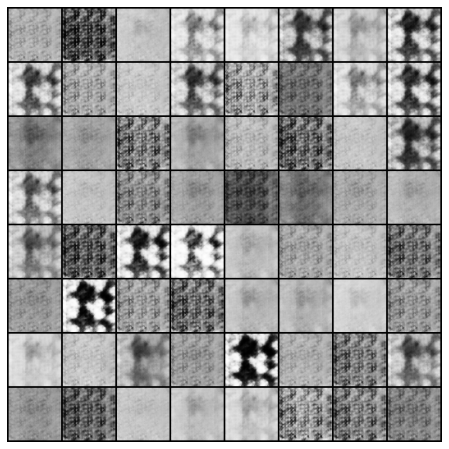

In [9]:
animate_gen_imgs()

# Trian : izif E

In [10]:
DC.eval()
D.eval()

kappa = 1.0
EC_losses = []

iters = 0
AE_img_list = []

def train_AE(epoch):
    global epochs
    global iters
    global EC_losses
    global AE_img_list
    
    # 인덱스 0부터 세기 시작
    # data[0].size():64x1x64x64(image) / data[1].size():64(label)
    for i,data in enumerate(data_loader,0):
        
        real_imgs = data[0].to(device)
        
        EC_optimizer.zero_grad()
        
        EC_validity = EC(real_imgs)
        
        fake_imgs = DC(EC_validity)
        
        _, real_features = D.forward(real_imgs)
        _, fake_features = D.forward(fake_imgs)
        
        
        # izif architecture
        imgs_loss = AE_criterion(real_imgs, fake_imgs)
        features_loss = AE_criterion(real_features, fake_features)
        EC_loss = imgs_loss + kappa*features_loss
        
        EC_loss.backward()
        EC_optimizer.step()
        
        # =============================================================
        # print
        # =============================================================
        print('[%d/%d][%d/%d]\n- E_loss: %.4f\n'
              %(epoch+1, epochs, i, len(data_loader), EC_loss.item()))
        
        # Save Losses for plotting later
        EC_losses.append(EC_loss.item())
        
        #Check how the generator is doing by saving G's output on noise_z
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = DC(EC_validity).detach().cpu()
            AE_img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
        
#torch.save(E.state_dict(), 'E.ckpt')

In [11]:
for epoch in range(epochs):
    train_AE(epoch)

[1/100][0/21]
- E_loss: 0.2091

[1/100][1/21]
- E_loss: 0.1653

[1/100][2/21]
- E_loss: 0.1764

[1/100][3/21]
- E_loss: 0.1839

[1/100][4/21]
- E_loss: 0.1647

[1/100][5/21]
- E_loss: 0.1710

[1/100][6/21]
- E_loss: 0.1953

[1/100][7/21]
- E_loss: 0.1606

[1/100][8/21]
- E_loss: 0.1773

[1/100][9/21]
- E_loss: 0.1683

[1/100][10/21]
- E_loss: 0.1182

[1/100][11/21]
- E_loss: 0.1392

[1/100][12/21]
- E_loss: 0.1492

[1/100][13/21]
- E_loss: 0.1075

[1/100][14/21]
- E_loss: 0.1287

[1/100][15/21]
- E_loss: 0.1627

[1/100][16/21]
- E_loss: 0.1533

[1/100][17/21]
- E_loss: 0.0989

[1/100][18/21]
- E_loss: 0.1279

[1/100][19/21]
- E_loss: 0.1310

[1/100][20/21]
- E_loss: 0.1020

[2/100][0/21]
- E_loss: 0.1296

[2/100][1/21]
- E_loss: 0.1719

[2/100][2/21]
- E_loss: 0.1209

[2/100][3/21]
- E_loss: 0.1142

[2/100][4/21]
- E_loss: 0.1009

[2/100][5/21]
- E_loss: 0.1040

[2/100][6/21]
- E_loss: 0.1130

[2/100][7/21]
- E_loss: 0.1213

[2/100][8/21]
- E_loss: 0.1064

[2/100][9/21]
- E_loss: 0.127

[13/100][0/21]
- E_loss: 0.0759

[13/100][1/21]
- E_loss: 0.0927

[13/100][2/21]
- E_loss: 0.0557

[13/100][3/21]
- E_loss: 0.0898

[13/100][4/21]
- E_loss: 0.0838

[13/100][5/21]
- E_loss: 0.0915

[13/100][6/21]
- E_loss: 0.0812

[13/100][7/21]
- E_loss: 0.0885

[13/100][8/21]
- E_loss: 0.0849

[13/100][9/21]
- E_loss: 0.0793

[13/100][10/21]
- E_loss: 0.0735

[13/100][11/21]
- E_loss: 0.0810

[13/100][12/21]
- E_loss: 0.0819

[13/100][13/21]
- E_loss: 0.0686

[13/100][14/21]
- E_loss: 0.0886

[13/100][15/21]
- E_loss: 0.0704

[13/100][16/21]
- E_loss: 0.0723

[13/100][17/21]
- E_loss: 0.0801

[13/100][18/21]
- E_loss: 0.0684

[13/100][19/21]
- E_loss: 0.0791

[13/100][20/21]
- E_loss: 0.0901

[14/100][0/21]
- E_loss: 0.0896

[14/100][1/21]
- E_loss: 0.0782

[14/100][2/21]
- E_loss: 0.0800

[14/100][3/21]
- E_loss: 0.0708

[14/100][4/21]
- E_loss: 0.0532

[14/100][5/21]
- E_loss: 0.0748

[14/100][6/21]
- E_loss: 0.0740

[14/100][7/21]
- E_loss: 0.0826

[14/100][8/21]
- E_loss: 0.0784


[24/100][15/21]
- E_loss: 0.0871

[24/100][16/21]
- E_loss: 0.0636

[24/100][17/21]
- E_loss: 0.0810

[24/100][18/21]
- E_loss: 0.0738

[24/100][19/21]
- E_loss: 0.0796

[24/100][20/21]
- E_loss: 0.0849

[25/100][0/21]
- E_loss: 0.0722

[25/100][1/21]
- E_loss: 0.0659

[25/100][2/21]
- E_loss: 0.0909

[25/100][3/21]
- E_loss: 0.0865

[25/100][4/21]
- E_loss: 0.0832

[25/100][5/21]
- E_loss: 0.0803

[25/100][6/21]
- E_loss: 0.0635

[25/100][7/21]
- E_loss: 0.0613

[25/100][8/21]
- E_loss: 0.0837

[25/100][9/21]
- E_loss: 0.0754

[25/100][10/21]
- E_loss: 0.0765

[25/100][11/21]
- E_loss: 0.0711

[25/100][12/21]
- E_loss: 0.1034

[25/100][13/21]
- E_loss: 0.0721

[25/100][14/21]
- E_loss: 0.0885

[25/100][15/21]
- E_loss: 0.0757

[25/100][16/21]
- E_loss: 0.0946

[25/100][17/21]
- E_loss: 0.0742

[25/100][18/21]
- E_loss: 0.0786

[25/100][19/21]
- E_loss: 0.0711

[25/100][20/21]
- E_loss: 0.0833

[26/100][0/21]
- E_loss: 0.0732

[26/100][1/21]
- E_loss: 0.0933

[26/100][2/21]
- E_loss: 0

[36/100][9/21]
- E_loss: 0.0719

[36/100][10/21]
- E_loss: 0.0821

[36/100][11/21]
- E_loss: 0.0752

[36/100][12/21]
- E_loss: 0.0889

[36/100][13/21]
- E_loss: 0.0718

[36/100][14/21]
- E_loss: 0.0896

[36/100][15/21]
- E_loss: 0.0725

[36/100][16/21]
- E_loss: 0.0764

[36/100][17/21]
- E_loss: 0.0969

[36/100][18/21]
- E_loss: 0.0682

[36/100][19/21]
- E_loss: 0.0814

[36/100][20/21]
- E_loss: 0.0855

[37/100][0/21]
- E_loss: 0.0829

[37/100][1/21]
- E_loss: 0.0866

[37/100][2/21]
- E_loss: 0.0862

[37/100][3/21]
- E_loss: 0.0888

[37/100][4/21]
- E_loss: 0.0844

[37/100][5/21]
- E_loss: 0.0714

[37/100][6/21]
- E_loss: 0.0673

[37/100][7/21]
- E_loss: 0.0851

[37/100][8/21]
- E_loss: 0.0737

[37/100][9/21]
- E_loss: 0.0718

[37/100][10/21]
- E_loss: 0.0769

[37/100][11/21]
- E_loss: 0.0867

[37/100][12/21]
- E_loss: 0.0690

[37/100][13/21]
- E_loss: 0.0672

[37/100][14/21]
- E_loss: 0.0656

[37/100][15/21]
- E_loss: 0.0778

[37/100][16/21]
- E_loss: 0.0843

[37/100][17/21]
- E_loss:

[48/100][3/21]
- E_loss: 0.0744

[48/100][4/21]
- E_loss: 0.0783

[48/100][5/21]
- E_loss: 0.0824

[48/100][6/21]
- E_loss: 0.0599

[48/100][7/21]
- E_loss: 0.0955

[48/100][8/21]
- E_loss: 0.0834

[48/100][9/21]
- E_loss: 0.0867

[48/100][10/21]
- E_loss: 0.0691

[48/100][11/21]
- E_loss: 0.0876

[48/100][12/21]
- E_loss: 0.0914

[48/100][13/21]
- E_loss: 0.0730

[48/100][14/21]
- E_loss: 0.0763

[48/100][15/21]
- E_loss: 0.0876

[48/100][16/21]
- E_loss: 0.0586

[48/100][17/21]
- E_loss: 0.0940

[48/100][18/21]
- E_loss: 0.0845

[48/100][19/21]
- E_loss: 0.0729

[48/100][20/21]
- E_loss: 0.0743

[49/100][0/21]
- E_loss: 0.0982

[49/100][1/21]
- E_loss: 0.0681

[49/100][2/21]
- E_loss: 0.0872

[49/100][3/21]
- E_loss: 0.0679

[49/100][4/21]
- E_loss: 0.0917

[49/100][5/21]
- E_loss: 0.0579

[49/100][6/21]
- E_loss: 0.0832

[49/100][7/21]
- E_loss: 0.0833

[49/100][8/21]
- E_loss: 0.0628

[49/100][9/21]
- E_loss: 0.0592

[49/100][10/21]
- E_loss: 0.0692

[49/100][11/21]
- E_loss: 0.077

[59/100][18/21]
- E_loss: 0.0685

[59/100][19/21]
- E_loss: 0.0738

[59/100][20/21]
- E_loss: 0.0869

[60/100][0/21]
- E_loss: 0.0816

[60/100][1/21]
- E_loss: 0.0713

[60/100][2/21]
- E_loss: 0.0708

[60/100][3/21]
- E_loss: 0.0887

[60/100][4/21]
- E_loss: 0.0697

[60/100][5/21]
- E_loss: 0.0599

[60/100][6/21]
- E_loss: 0.0846

[60/100][7/21]
- E_loss: 0.0808

[60/100][8/21]
- E_loss: 0.0746

[60/100][9/21]
- E_loss: 0.0703

[60/100][10/21]
- E_loss: 0.0821

[60/100][11/21]
- E_loss: 0.0796

[60/100][12/21]
- E_loss: 0.0793

[60/100][13/21]
- E_loss: 0.0701

[60/100][14/21]
- E_loss: 0.0797

[60/100][15/21]
- E_loss: 0.0814

[60/100][16/21]
- E_loss: 0.0728

[60/100][17/21]
- E_loss: 0.0641

[60/100][18/21]
- E_loss: 0.0932

[60/100][19/21]
- E_loss: 0.0938

[60/100][20/21]
- E_loss: 0.0662

[61/100][0/21]
- E_loss: 0.0684

[61/100][1/21]
- E_loss: 0.0679

[61/100][2/21]
- E_loss: 0.0886

[61/100][3/21]
- E_loss: 0.0770

[61/100][4/21]
- E_loss: 0.0795

[61/100][5/21]
- E_loss: 0.08

[71/100][12/21]
- E_loss: 0.0600

[71/100][13/21]
- E_loss: 0.0799

[71/100][14/21]
- E_loss: 0.0743

[71/100][15/21]
- E_loss: 0.0820

[71/100][16/21]
- E_loss: 0.0869

[71/100][17/21]
- E_loss: 0.0764

[71/100][18/21]
- E_loss: 0.0716

[71/100][19/21]
- E_loss: 0.0663

[71/100][20/21]
- E_loss: 0.0703

[72/100][0/21]
- E_loss: 0.0838

[72/100][1/21]
- E_loss: 0.0711

[72/100][2/21]
- E_loss: 0.0901

[72/100][3/21]
- E_loss: 0.0737

[72/100][4/21]
- E_loss: 0.0640

[72/100][5/21]
- E_loss: 0.1023

[72/100][6/21]
- E_loss: 0.0753

[72/100][7/21]
- E_loss: 0.0688

[72/100][8/21]
- E_loss: 0.1017

[72/100][9/21]
- E_loss: 0.0693

[72/100][10/21]
- E_loss: 0.0582

[72/100][11/21]
- E_loss: 0.0729

[72/100][12/21]
- E_loss: 0.0628

[72/100][13/21]
- E_loss: 0.0689

[72/100][14/21]
- E_loss: 0.0827

[72/100][15/21]
- E_loss: 0.0684

[72/100][16/21]
- E_loss: 0.0715

[72/100][17/21]
- E_loss: 0.0714

[72/100][18/21]
- E_loss: 0.0855

[72/100][19/21]
- E_loss: 0.0780

[72/100][20/21]
- E_loss

[83/100][6/21]
- E_loss: 0.0787

[83/100][7/21]
- E_loss: 0.0786

[83/100][8/21]
- E_loss: 0.0687

[83/100][9/21]
- E_loss: 0.0782

[83/100][10/21]
- E_loss: 0.0916

[83/100][11/21]
- E_loss: 0.0770

[83/100][12/21]
- E_loss: 0.0759

[83/100][13/21]
- E_loss: 0.0628

[83/100][14/21]
- E_loss: 0.0641

[83/100][15/21]
- E_loss: 0.0751

[83/100][16/21]
- E_loss: 0.0860

[83/100][17/21]
- E_loss: 0.0670

[83/100][18/21]
- E_loss: 0.0595

[83/100][19/21]
- E_loss: 0.0850

[83/100][20/21]
- E_loss: 0.0995

[84/100][0/21]
- E_loss: 0.0598

[84/100][1/21]
- E_loss: 0.0869

[84/100][2/21]
- E_loss: 0.0666

[84/100][3/21]
- E_loss: 0.0600

[84/100][4/21]
- E_loss: 0.0770

[84/100][5/21]
- E_loss: 0.0916

[84/100][6/21]
- E_loss: 0.0851

[84/100][7/21]
- E_loss: 0.0685

[84/100][8/21]
- E_loss: 0.0833

[84/100][9/21]
- E_loss: 0.0736

[84/100][10/21]
- E_loss: 0.0997

[84/100][11/21]
- E_loss: 0.0575

[84/100][12/21]
- E_loss: 0.0622

[84/100][13/21]
- E_loss: 0.0778

[84/100][14/21]
- E_loss: 0.

[95/100][0/21]
- E_loss: 0.0892

[95/100][1/21]
- E_loss: 0.0694

[95/100][2/21]
- E_loss: 0.0771

[95/100][3/21]
- E_loss: 0.0844

[95/100][4/21]
- E_loss: 0.0721

[95/100][5/21]
- E_loss: 0.0794

[95/100][6/21]
- E_loss: 0.0761

[95/100][7/21]
- E_loss: 0.0650

[95/100][8/21]
- E_loss: 0.0691

[95/100][9/21]
- E_loss: 0.0820

[95/100][10/21]
- E_loss: 0.0695

[95/100][11/21]
- E_loss: 0.0648

[95/100][12/21]
- E_loss: 0.0691

[95/100][13/21]
- E_loss: 0.0806

[95/100][14/21]
- E_loss: 0.0736

[95/100][15/21]
- E_loss: 0.0813

[95/100][16/21]
- E_loss: 0.0790

[95/100][17/21]
- E_loss: 0.0611

[95/100][18/21]
- E_loss: 0.0834

[95/100][19/21]
- E_loss: 0.0816

[95/100][20/21]
- E_loss: 0.0783

[96/100][0/21]
- E_loss: 0.0797

[96/100][1/21]
- E_loss: 0.0742

[96/100][2/21]
- E_loss: 0.0886

[96/100][3/21]
- E_loss: 0.0710

[96/100][4/21]
- E_loss: 0.0661

[96/100][5/21]
- E_loss: 0.0703

[96/100][6/21]
- E_loss: 0.0958

[96/100][7/21]
- E_loss: 0.0794

[96/100][8/21]
- E_loss: 0.0605


# Loss Graph

In [12]:
def plot_train_loss():
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(DC_losses, label="G")
    plt.plot(D_losses, label="D")
    plt.plot(EC_losses, label="E")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

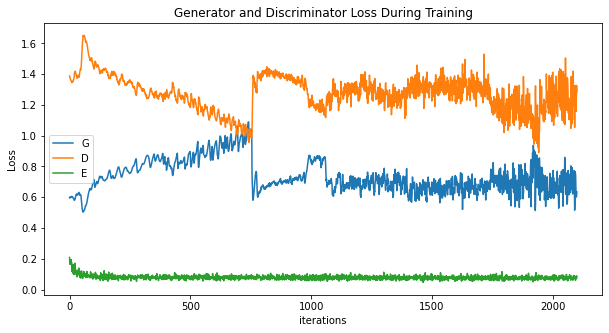

In [13]:
plot_train_loss()

---

# Test Data

In [14]:
#test_data_root = "../../dataset/test/test_DualPhaseSteel"
CFRP_test_data_root = "../../dataset/test/test_CFRP"

test_data_set = dataset.ImageFolder(root = CFRP_test_data_root, # test_data_root,
                           transform = transforms.Compose([
                                  transforms.Resize(img_size),
                                  transforms.CenterCrop(img_size),
                                  torchvision.transforms.Grayscale(channel),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5,),(0.5,))
                              ]))

# 배치로 나누고 셔플하기
test_data_loader = torch.utils.data.DataLoader(test_data_set, batch_size = 1,
                                              shuffle = False, num_workers = workers)

# 이상 픽셀 수 확인 함수

In [15]:
def count_el_not_0(diff_img):
    count_el_not_0 = 0
    
    col_size = diff_img.shape[0]
    row_size = diff_img.shape[1]
    
    #print(col_size, row_size)
    
    for col in range(col_size):
        for row in range(row_size):
            if diff_img[col][row] != 0:
                count_el_not_0 += 1
                
    return count_el_not_0

# img 비교 함수

In [16]:
def compare_imgs(real_img, generated_img, i, score, reverse=False, threshold=50):
    real_img = real_img.cpu().data.numpy().reshape(img_size, img_size) * 255
    generated_img = generated_img.cpu().data.numpy().reshape(img_size, img_size) * 255
    
    negative = np.zeros_like(real_img)

    if not reverse:
        diff_img = real_img - generated_img
    else:
        diff_img = generated_img - real_img

    diff_img[diff_img <= threshold] = 0

    # 분율 추출
    diff_cnts.append(count_el_not_0(diff_img))
    # 분산 추출
    diff_points.append(np.where(diff_img > threshold))
    
    anomaly_img = np.zeros(shape=(img_size, img_size, 3))
    anomaly_img[:, :, 0] = real_img - diff_img
    anomaly_img[:, :, 1] = real_img - diff_img
    anomaly_img[:, :, 2] = real_img - diff_img
    anomaly_img[:, :, 0] = anomaly_img[:,:,0] + diff_img
    anomaly_img = anomaly_img.astype(np.uint8)

    # anomaly_img 추출
    anomaly_imgs.append(anomaly_img)
    
    fig, plots = plt.subplots(1, 4)

    fig.suptitle(f'Anomaly - (anomaly score: {score:.4})')
    
    fig.set_figwidth(9)
    fig.set_tight_layout(True)
    plots = plots.reshape(-1)
    plots[0].imshow(real_img, cmap='gray', label = "real")
    plots[1].imshow(generated_img, cmap='gray')
    plots[2].imshow(diff_img, cmap='gray')
    plots[3].imshow(anomaly_img)
    
    plots[0].set_title('real')
    plots[1].set_title('generated')
    plots[2].set_title('difference')
    plots[3].set_title('Anomaly Detection')
    plt.show()

# Test

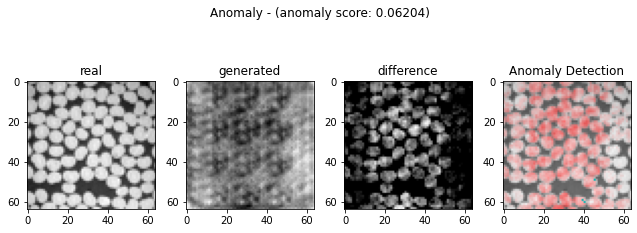

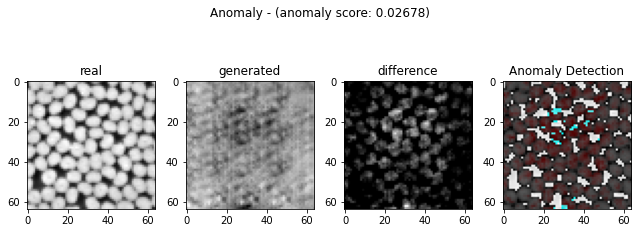

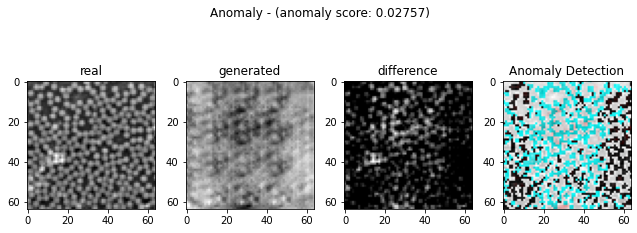

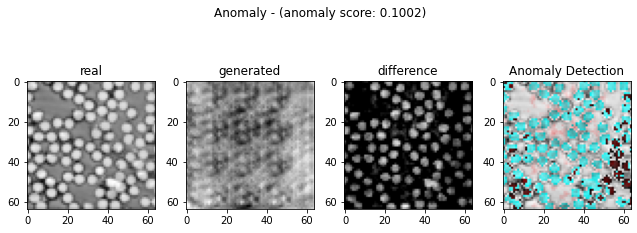

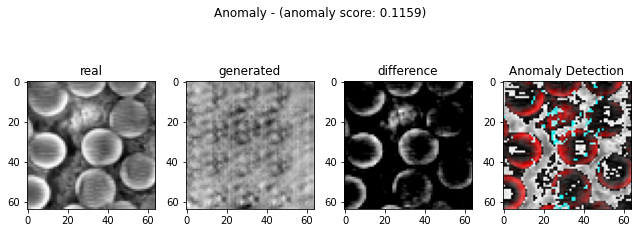

...

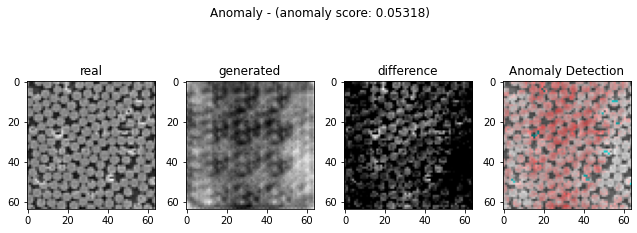

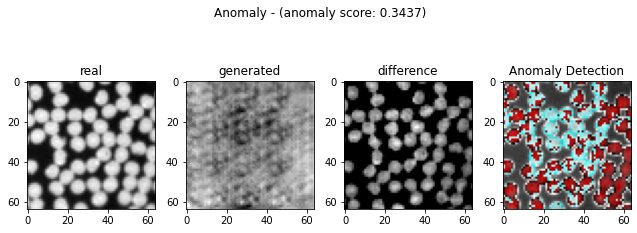

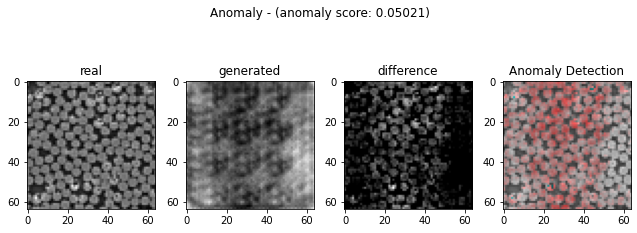

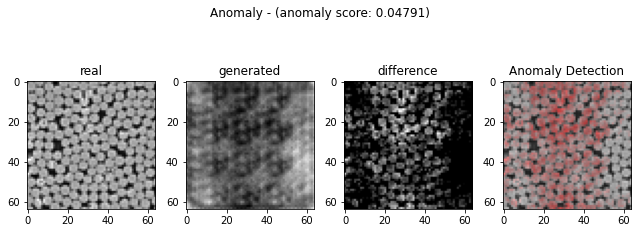

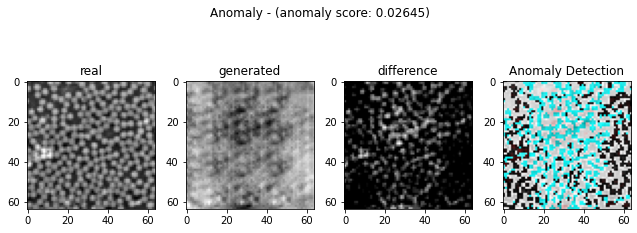

In [17]:
diff_cnts = []
diff_points = []
anomaly_imgs = []

ano_criterion = nn.MSELoss()
DC.eval()
D.eval()
EC.eval()

# with open("score.csv", "w") as f:
#         f.write("label,img_distance,anomaly_score,z_distance\n")

for i, data in enumerate(test_data_loader, 0):
    real_img = data[0].to(device)

    real_z = EC(real_img) # 진짜 이미지의 latent vector
    fake_img = DC(real_z) # DC에 넣어서 가짜 이미지 생성.
    fake_z = EC(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

    _, real_feature = D.forward(real_img) # 1, 256
    _, fake_feature = D.forward(fake_img)

    img_distance = ano_criterion(fake_img, real_img)
    loss_feature = ano_criterion(fake_feature, real_feature)

    anomaly_score = img_distance + kappa*loss_feature

    z_distance = ano_criterion(fake_z, real_z)
    
#     with open("score.csv", "a") as f:
#             f.write(f"{label.item()},{img_distance},"
#                     f"{anomaly_score},{z_distance}\n")
            
#     print(f"{label.item()}, {img_distance}, "
#           f"{anomaly_score}, {z_distance}\n")
    compare_imgs(real_img, fake_img, i, anomaly_score, reverse = False, threshold = 0.3)

---

# 분율 추출

In [18]:
diff_cnts = np.array(diff_cnts)

diff_fraction = diff_cnts / img_size ** 2

print(diff_fraction)

[0.60229492 0.53417969 0.51416016 0.50341797 0.41137695 0.5390625
 0.49853516 0.58642578 0.4777832  0.60205078 0.46118164 0.64526367
 0.5090332  0.53588867 0.56274414 0.51318359 0.51635742 0.52539062
 0.3034668  0.48901367 0.55395508 0.47436523 0.53271484 0.49853516
 0.53930664 0.48974609 0.60229492 0.57397461 0.55126953 0.50805664
 0.47241211 0.53051758 0.53222656 0.54858398 0.4987793  0.46679688
 0.49487305 0.58227539 0.50756836 0.47973633 0.54956055 0.55493164
 0.55200195 0.55688477 0.51855469 0.53466797 0.62109375 0.52172852
 0.58154297 0.45117188 0.53222656 0.54467773 0.44921875 0.51586914
 0.59643555 0.61303711 0.52368164 0.56835938 0.57885742 0.4909668 ]


In [19]:
sum(diff_fraction)/len(diff_fraction)

0.5270711263020833

---

# 분산 추출

In [20]:
from scipy import stats
from extended_int import int_inf

corr_coeffis = []
corr_p_vals = []

def cal_corr_coeffis():
    for idx in range(len(test_data_loader)):
        x_points = diff_points[idx][0]
        y_points = diff_points[idx][1]
        
        
        if len(x_points) > 0:
            corr_coeffi, corr_p_val = stats.pearsonr(x_points, y_points)
        else:
            corr_coeffi, corr_p_val = -int_inf, -int_inf
        
        corr_coeffis.append(corr_coeffi)
        corr_p_vals.append(corr_p_val)

In [21]:
cal_corr_coeffis()

print(corr_coeffis)

[0.01436168121201137, -0.018623352189014147, -0.07341657239240727, -0.0382892388135645, -0.0015598439433082431, 0.004918281726722523, 0.01106380455543957, -0.026000406659026372, -0.01363966712754167, -0.0071412929391286364, -0.1329267625380241, -0.044960650813306635, 0.0006646233584606453, -0.009097572461609619, 0.0712471148007939, -0.02067030817113827, -0.05070989341400252, -0.04212208182271472, 0.3112835310382099, 0.053739948927020394, -0.024277359087049755, -0.00139560832954597, -0.01937660691132765, -0.03985844025496356, -0.001596539919270533, -0.055537947611318965, -0.038341133328390196, -0.019629468470019215, 0.002270380019647614, -0.05435178660411801, 0.04296375900976502, -0.04663406573456645, -0.03496757781865063, -0.0025755407129576923, -0.03253462894780913, 0.010024818557474544, 0.009669539561419839, 0.027943713306573997, -0.01839236119780113, 0.04802922771285039, -0.03548130758816875, 0.014060267835909007, -0.014848682552769114, -0.027100197295980174, -0.013603037233901568, 

---

# 모델 저장 및 읽기

In [22]:
save_file = "./pretrained/pretrained.pth"

def save_pretrained():
    pretrained = {
        "D" : D.state_dict(),
        "DC" : DC.state_dict(),
        "EC" : EC.state_dict()
    }

    if not os.path.isdir("pretrained"):
        os.mkdir("pretrained")
    torch.save(pretrained, save_file)

In [23]:
save_pretrained()

In [24]:
pretrained_D = Discriminator().to(device)
pretrained_DC = Decoder().to(device)
pretrained_EC = Encoder().to(device)

def load_pretrained():
    global pretrained_D
    global pretrained_DC
    global pretrained_EC
    
    assert os.path.isdir("pretrained"), "Error : no pretrained dir found!"
    
    pretrained = torch.load(save_file)
    
    pretrained_D.load_state_dict(pretrained["D"])
    pretrained_DC.load_state_dict(pretrained["DC"])
    pretrained_EC.load_state_dict(pretrained["EC"])
    
    #print("pretrained_D :", pretrained_D)
    #print("pretrained_G :", pretrained_DC)
    #print("pretrained_E :", pretrained_EC)

In [25]:
load_pretrained()

In [26]:
def test():
    ano_criterion = nn.MSELoss()
    pretrained_DC.eval()
    pretrained_D.eval()
    pretrained_EC.eval()

    # with open("score.csv", "w") as f:
    #         f.write("label,img_distance,anomaly_score,z_distance\n")

    for i, data in enumerate(test_data_loader, 0):
        real_img = data[0].to(device)

        real_z = pretrained_EC(real_img) # 진짜 이미지의 latent vector
        fake_img = pretrained_DC(real_z) # DC에 넣어서 가짜 이미지 생성.
        fake_z = pretrained_EC(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

        _, real_feature = pretrained_D.forward(real_img) # 1, 256
        _, fake_feature = pretrained_D.forward(fake_img)

        img_distance = ano_criterion(fake_img, real_img)
        loss_feature = ano_criterion(fake_feature, real_feature)

        anomaly_score = img_distance + kappa*loss_feature

        z_distance = ano_criterion(fake_z, real_z)

    #     with open("score.csv", "a") as f:
    #             f.write(f"{label.item()},{img_distance},"
    #                     f"{anomaly_score},{z_distance}\n")

    #     print(f"{label.item()}, {img_distance}, "
    #           f"{anomaly_score}, {z_distance}\n")
        compare_imgs(real_img, fake_img, i, anomaly_score, reverse = False, threshold = 0.3)

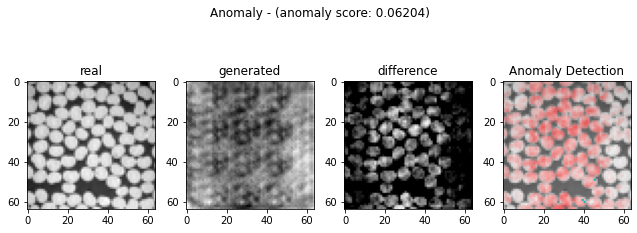

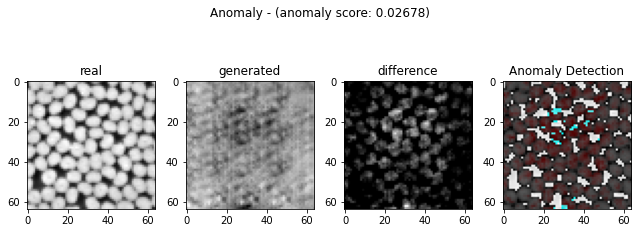

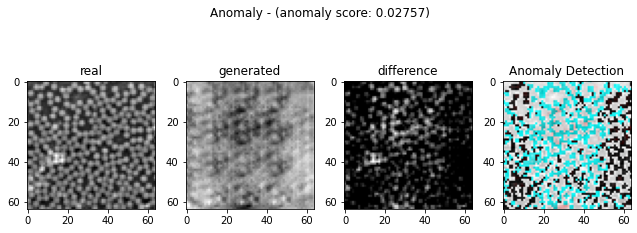

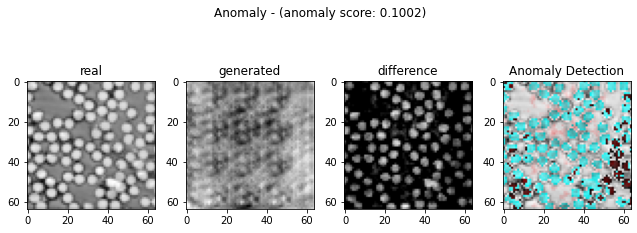

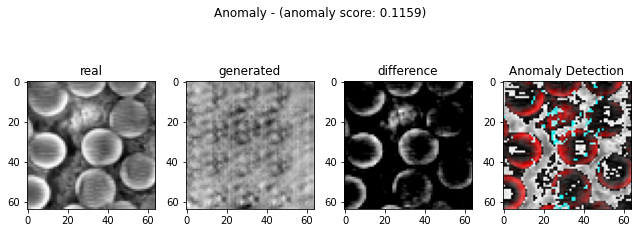

...

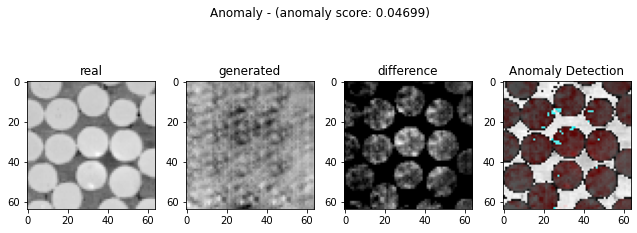

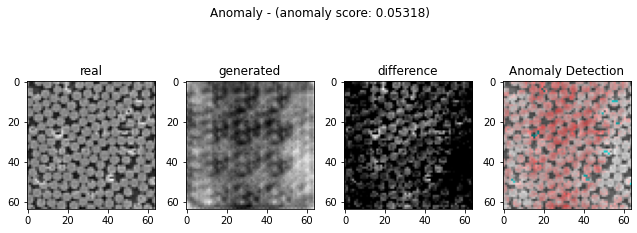

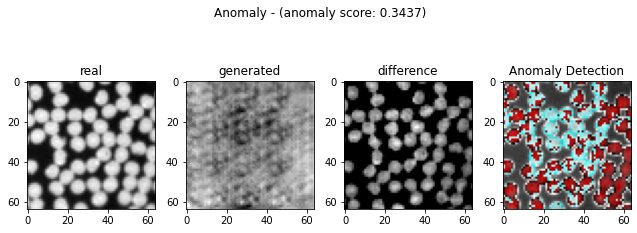

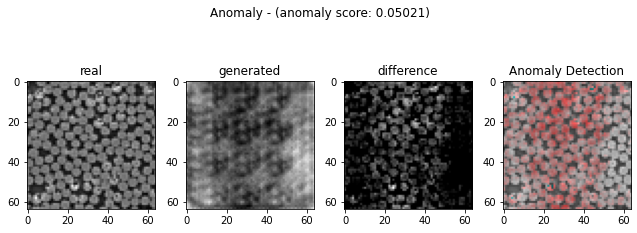

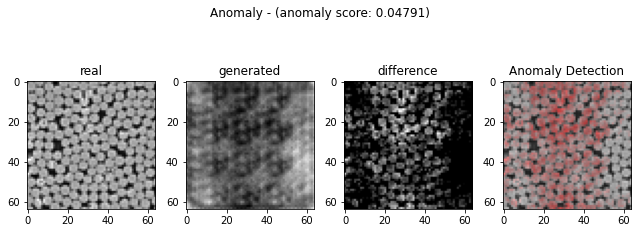

In [ ]:
diff_cnts = []
diff_points = []
anomaly_imgs = []

corr_coeffis = []
corr_p_vals = []

test()

In [ ]:
diff_cnts = np.array(diff_cnts)

diff_fraction = diff_cnts / img_size ** 2

print(diff_fraction)

In [ ]:
cal_corr_coeffis()

print(corr_coeffis)

---

# anomaly detection 이미지 추출

In [ ]:
anomaly_imgs

# 이미지 저장 함수

In [ ]:
import cv2

def save_imgs(folder, imgs):
    if not os.path.isdir("anomaly_imgs"):
        os.mkdir("anomaly_imgs")
    
    for i in range(len(imgs)):
        cv2.imwrite('%s/%d.png' %(folder,i), imgs[i]) #이미지 저장할 경로 설정을 여기서 한다.
    print("image saving complete")

In [ ]:
save_imgs("./anomaly_imgs", anomaly_imgs)

---

# 티타늄(Ti64) 상대 밀도 계산

In [ ]:
Ti64_density = 4.43

Ti64_rel_densitys = np.array([])

Ti64_rel_densitys = diff_fraction * Ti64_density

print(Ti64_rel_densitys)